# HW 3 Optimization (80pts)

**Due 11:59pm, Apr 29th.**

## Please restart the kernel and run all before you submit !


## Your Name: Anshika Khandelwal

In [1]:
# import packages
import numpy as np
from sklearn.linear_model import LinearRegression, SGDRegressor
import matplotlib.pyplot as plt
import time

# Exercise 1: SGD with arbitrary batch size  (50pts)

**The goal of this exercise is to implement SGD with arbitrary batch size for a certain linear regression model.** 

Given data points $(x^i,y^i)_{i=1}^m$ where each data point $x$ has three features/attributes, i.e. $x=(x_1,x_2,x_3)$, we consider the following linear regression model
$$ y =  a_0 + a_1x_1 + a_2x_2 + a_3x_3.$$

Here, $a_0,a_1,a_2,a_3$ are coefficients. 

The corresponding optimization problem is 

$$ \mathop{\mathrm{Loss}}(a_0,a_1,a_2,a_3) = \frac{1}{m}\sum_{i=1}^{m} (a_0+a_1x_1^i+a_2x_2^i+a_3x_3^i-y^i)^2 $$


You should do the following three things:

1. Write a python function to implement SGD with arbitrary batch_size. Hint: you can write it as a python function and treat batch size as a function input.

2. Select at least 4 batch sizes and fix the number of iteration, then run SGD for different batch sizes, report the the running time for each batch size (use `print`). What is your conclusion?

3. For each batch size you used in part 2, draw a plot to visualize the loss (y-axis) vs iterations (x-axis). What is your conclusion?

Requirements:

1. Your SGD algorithm should allow different batch sizes. 

2. Write python functions or for loop to do 2 and 3.

3. Detailed docustring is required for each function. Add necessary inline comments and markdown to explain your code and make comments.

Grading is based on the codes (15 pts), function docstrings (10 pts), comments (10 pts) and conclusions (15 pts).

In [2]:
# run this cell to generate data points
m = 10000                                # number of data points
n = 3                                    # number of features
x = np.random.randn(m,n)                 # each row of x represents a data point
theta = np.random.randn(n,1)             # true coefficients a_1, a_2, a_3
y = x@theta + 3 + np.random.rand(m,1)    # observations and true a_0 = 3

In [3]:
# Your code here
def SGDArbitaryBatchSize(x, y, a0, a1, a2, a3, batch_size, eps, n_steps):
    """
    SGD with arbitrary batch size for linear regression.

    Parameters:
        x (numpy array): Input features matrix of shape (m, n), where m is the number of data points
            and n is the number of features.
        y (numpy array): Target values vector of shape (m, 1).
        a0 (float): Initialised value for coefficient a0.
        a1 (float): Initialised value for coefficient a1.
        a2 (float): Initialised value for coefficient a2.
        a3 (float): Initialised value for coefficient a3.
        batch_size (int): Size of the batch used in each iteration of SGD.
        eps (float): Learning rate for updating coefficients.
        n_steps (int): Number of iterations for SGD.

    Returns:
        float: The final loss value after performing SGD.

    Note:
        This function performs stochastic gradient descent (SGD) to minimize the mean squared error loss
        for a linear regression model of the form: y = a0 + a1*x1 + a2*x2 + a3*x3.

        In each step of SGD, a random batch of data points is selected with replacement from the entire
        dataset (x, y). The gradients of the loss function with respect to the coefficients (a0, a1, a2, a3)
        are computed using the selected batch, and the coefficients are updated accordingly.

        The process continues for a fixed number of iterations.
    """
    
    for t in range(n_steps):

        # random select one point to update k, b each iteration
        j = np.random.choice(m,batch_size)
        x_j, y_j = x[j], y[j]
        y_j = y_j.reshape(batch_size)

        # approximate gradient using randomly selected point 
        g_a0 = 2 * sum(a0 + a1*x_j[:,0] + a2*x_j[:,1] + a3*x_j[:,2] - y_j)/batch_size
        g_a1 = 2 * sum((a0 + a1*x_j[:,0] + a2*x_j[:,1] + a3*x_j[:,2] - y_j) * x_j[:,0])/batch_size
        g_a2 = 2 * sum((a0 + a1*x_j[:,0] + a2*x_j[:,1] + a3*x_j[:,2] - y_j) * x_j[:,1])/batch_size
        g_a3 = 2 * sum((a0 + a1*x_j[:,0] + a2*x_j[:,1] + a3*x_j[:,2] - y_j) * x_j[:,2])/batch_size
        # update using GD
        a0 = a0 - eps*g_a0
        a1 = a1 - eps*g_a1
        a2 = a2 - eps*g_a2
        a3 = a3 - eps*g_a3

        # compute current loss
        L = np.sum((a0 + a1*x[:,0] + a2*x[:,1] + a3*x[:,2] - y.reshape(m))**2) / m
    return L

In [4]:
SGDArbitaryBatchSize(x, y, -2, 1, 1, 1, 5, 0.01, 1000)

0.08476944290026153

In [5]:
batch_size = [1,1000,5000,10000]
def SGDFixedBatchSize(x, y, a0, a1, a2, a3, batch_size):
    """
    SGD with fixed batch sizes for linear regression.

    Parameters:
        x (numpy array): Input features matrix of shape (m, n), where m is the number of data points
            and n is the number of features.
        y (numpy array): Target values vector of shape (m, 1).
        a0 (float): Initialised value for coefficient a0.
        a1 (float): Initialised value for coefficient a1.
        a2 (float): Initialised value for coefficient a2.
        a3 (float): Initialised value for coefficient a3.
        batch_size (list): List of batch sizes that have been fixed to be used for SGD.

    Returns:
        None

    Note:
        This function performs SGD with fixed batch sizes to minimize the mean squared error loss
        for a linear regression model of the form: y = a0 + a1*x1 + a2*x2 + a3*x3.

        For each batch size in the list `batch_size`, the function performs SGD for a fixed number of iterations
        updating the coefficients (a0, a1, a2, a3) using the gradients computed from the selected batch.

        After each batch size iteration, a plot is generated showing the loss values over the iterations, and the computation time for each batch size
        is printed.

    """
    for i in batch_size:
        start = time.time()
        lossValues = [] 
        a0_temp, a1_temp, a2_temp, a3_temp = a0, a1, a2, a3

        for t in range(1000):
            j = np.random.choice(m,i)
            x_j, y_j = x[j], y[j]
            y_j = y_j.reshape(i)
            # approximate gradient using randomly selected point 
            g_a0 = 2 * sum(a0_temp + a1_temp*x_j[:,0] + a2_temp*x_j[:,1] + a3_temp*x_j[:,2] - y_j)/i
            g_a1 = 2 * sum((a0_temp + a1_temp*x_j[:,0] + a2_temp*x_j[:,1] + a3_temp*x_j[:,2] - y_j) * x_j[:,0])/i
            g_a2 = 2 * sum((a0_temp + a1_temp*x_j[:,0] + a2_temp*x_j[:,1] + a3_temp*x_j[:,2] - y_j) * x_j[:,1])/i
            g_a3 = 2 * sum((a0_temp + a1_temp*x_j[:,0] + a2_temp*x_j[:,1] + a3_temp*x_j[:,2] - y_j) * x_j[:,2])/i
            # update using GD
            a0_temp = a0_temp - 0.0025*g_a0
            a1_temp = a1_temp - 0.0025*g_a1
            a2_temp = a2_temp - 0.0025*g_a2
            a3_temp = a3_temp - 0.0025*g_a3

            # compute current loss
            L = np.sum((a0_temp + a1_temp*x[:,0] + a2_temp*x[:,1] + a3_temp*x[:,2] - y.reshape(m))**2) / m 
            lossValues.append(L)
        
        plt.plot(range(1000), lossValues, label=f'Batch Size: {i}')
        end = time.time()
        print(f'Computation time for batch of size {i} is {end-start} seconds')
        
    plt.legend()
    plt.xlabel('Iterations')
    plt.ylabel('Loss')
    plt.title('Loss vs. Iterations for Different Batch Sizes')
    plt.show()

Computation time for batch of size 1 is 0.13152623176574707 seconds
Computation time for batch of size 1000 is 0.4020090103149414 seconds
Computation time for batch of size 5000 is 1.6428442001342773 seconds
Computation time for batch of size 10000 is 3.1925339698791504 seconds


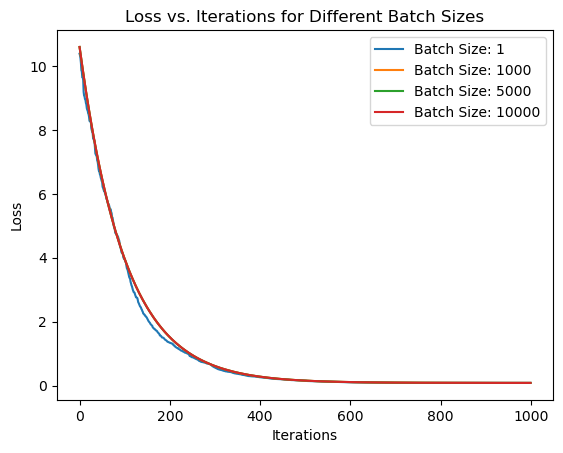

In [6]:
SGDFixedBatchSize(x, y, 0.5, 0.5, 0.5, 0.5, batch_size)

Conclusions:

Relationship between running time and batch size: 
- as the batch size increases, the running time increases. When the batch size is 1, for example, the running time is the lowest, whereas when all the data points are used in a batch size of 10,000 the running time is the highest. - This suggests that larger batch sizes require more computation time due to increased data processing.

Relationship between number of iterations and loss: 
- as the number of iterations increases, the loss value decreases in a non-linear fashion (graph resembles shape of negative exponential). 
- This indicates that while more iterations generally result in lower loss values, the rate of decrease diminishes over time, suggesting diminishing returns with additional iterations.

Also, it is hard to distinguish between batch sizes using the graph because the values are so similar between the batch sizes

# Exercise 2: SGD animation for polynomial regression (30 pts)

In this exercise, our goal is to create a similar animation (which is available [here](https://nbviewer.org/github/PhilChodrow/PIC16B/blob/master/lectures/math/optimization.ipynb)) for polynomial regression model.  


#### Comments:
You cannot copy the code in the link directly because 

1. the sample code is for simple linear regression only, but we are considering polynomial regression.

2. the data generating process is included in the class initialization, however training data are provided in this exercise.

Please understand the sample code first, and then modify it accordingly. It is also fine if you do not write a class (class is used in the sample code) to do the animation.

200 interations are used in the sample code. Since our model is complicated here, you can use more iterations if you like.

#### Grading policy:
1. There is no error in your code.
2. The animation result looks reasonable.
3. Docstring and comments are required for your code.


#### Mathematics on polynomial regression:
Given data points $(x_i,y_i)_{i=1}^m$, polynomial regression is considered if we believe that the true relation between input $x$ and output $y$ can be described by a polynomial $y=a_0+a_1x+\cdots+a_nx^n$ for some degree $n$.

The goal is to find coefficients $a_0,\cdots,a_n$ by minimizing the loss function
$$ \mathop{\mathrm{minimize}}_{a_o,\cdots,a_n} \frac{1}{m}\sum_{i=1}^m (a_0+a_1x_i+\cdots+a_nx_i^n-y_i)^2 $$

Then we can use SGD to solve this optimization problem.

#### Data Generation

Please run the following code to generate the data points.

In [7]:
import numpy as np

# number of observations
m = 100
# generate input x 
X = np.random.uniform(0,3,m)
X.sort()
# generate output y
y = -2 - 2*X + X**2 + 0.1*np.random.randn(m)

In [8]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [9]:
class UpdatePlot:
    """
    An update class for a polynomial regression SGD animation. Takes instance variables corresponding to plot objects, 
    parameters and estimates, and animation controls. Calling the class updates the plot.
    Methods:
            __call__(self, i): Method for updating the plots during animation.
    """
    
    def __init__(self, ax, a_real, a_init, eps=0.01, X=None, y=None):
        """
        Initialise the UpdatePlot object.

        Parameters:
            ax (matplotlib axes): The matplotlib axes object to plot on.
            a_real : True coefficients of the polynomial.
            a_init : Initial estimates of the coefficients.
            eps (float, optional): Learning rate for gradient descent updates. Default is 0.01.
            X (optional): Input data points. Default is None.
            y (optional): Target values. Default is None.
        """
        self.ax0 = ax[0]
        self.ax1 = ax[1]

        # True coefficients
        self.a_real = np.array(a_real, dtype=np.float64)

        # Initial coefficient estimates
        self.a_init = np.array(a_init, dtype=np.float64)

        # Data
        self.X = X
        self.y = y

        # Number of data points
        self.n = len(X) if X is not None else 0

        # Polynomial degree
        self.degree = len(a_real) - 1

        # Create data for plotting
        self.x_space = np.linspace(0, 3, 10)
        self.X_poly = np.vander(self.X, N=self.degree + 1, increasing=True) #had to google this

        # Scatter plot of data points
        if X is not None and y is not None:
            self.ax0.scatter(self.X, self.y, color="grey", s=4, zorder=100)

        # Animation variables
        self.point = self.ax0.scatter([], [], color="red", zorder=200)
        self.line, = self.ax0.plot([], [], 'k-')
        self.loss, = self.ax1.plot([], [], 'k-')

        # Learning rate
        self.eps = eps

        # Timesteps and loss function values
        self.t = []
        self.L = []
    def __call__(self, i):
        """
        Perform one iteration of gradient descent and update the plots.

        Parameters:
            i (int): Current iteration index.

        Returns:
            List of updates to plot.
        """
        
        # Pick a random point
        j = np.random.randint(self.n)
        x, y = self.X[j], self.y[j]

        # Update estimates with gradient of loss function evaluated at that point with respect to the coefficients
        grad = 2 * (np.dot(self.X_poly[j], self.a_init) - y) * self.X_poly[j]
        self.a_init -= self.eps * grad

        # Evaluate loss function
        residuals = np.dot(self.X_poly, self.a_init) - self.y #had to google
        loss = np.mean(residuals ** 2)

        # Update lefthand plot with highlight point and new regression line
        self.point.set_offsets([[x, y]])
        self.line.set_data(self.x_space, np.dot(np.vander(self.x_space, N=self.degree + 1, increasing=True), self.a_init))

        # Update timestep and loss function
        self.t.append(i)
        self.L.append(loss)

        # Plot loss function
        self.loss.set_data(self.t, self.L)

        # Update y-axis limits of the loss subplot
        max_loss = max(self.L)
        self.ax1.set_ylim(0, max_loss * 1.2) 

        # Return artists
        return [self.point, self.line, self.loss]

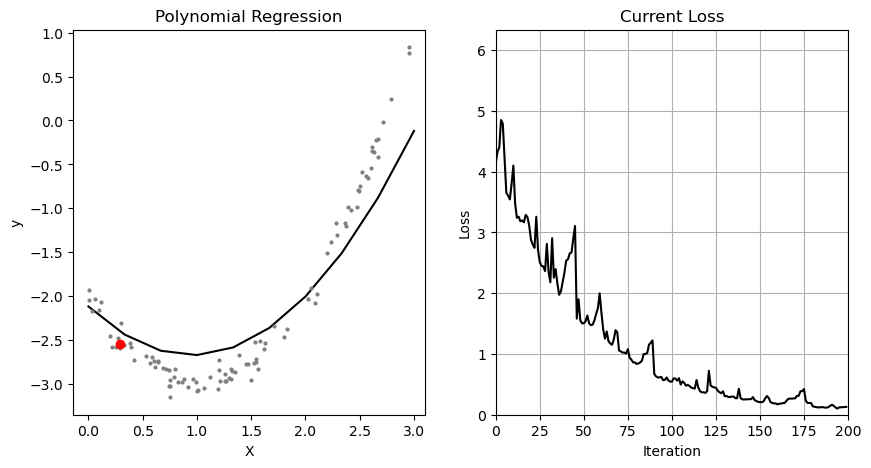

In [10]:
# Actual coefficients of the polynomial
a_real = np.array([-2, 0, 1])

# Estimates of the coefficients
a_init = np.array([0, 0, 0])

# Number of algorithm iterations
n_steps = 200

# Create subplots for animation
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

# Set plot titles and labels
ax[0].set(title="Polynomial Regression", xlabel="X", ylabel="y")
ax[1].set(title="Current Loss", xlabel="Iteration", ylabel="Loss")

# Set limits and grid for loss plot
ax[1].set_xlim(0, n_steps)
ax[1].set_ylim(0, 5)
ax[1].grid(True)

# Create the UpdatePlot instance
update_plot = UpdatePlot(ax, a_real, a_init, eps=0.01, X=X, y=y)

# Create animation
anim = FuncAnimation(fig, update_plot, frames=n_steps, interval=100, blit=True)

# Display animation
HTML(anim.to_jshtml())